In [1]:
from analytics import operation_builder
from analytics.parser import *
from analytics.visualization import *
import os
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import sent2vec

In [2]:

def numberOperation(x):
    num = 0
    for win in x:
        num +=len(win.operations)
    return num

def select(data,threshold):
    columns = data.columns
    valid = []
    for column in columns:
        percentage = len(data.loc[data[column]>threshold])*1.0/len(data)
        valid.append(percentage)
    data.loc['valid'] = valid
    return data
    

In [3]:

list_of_elem_ops_per_pad = dict()
elemOpsCounter = 0
root_of_dbs = "../data/"


In [4]:
for (dirpath, dirnames, filenames) in os.walk(root_of_dbs):
    for filename in filenames:
        
        if '.sql' in filename:
            path_to_db = os.path.join(dirpath, filename)
            # Fetching the new operations
            list_of_elem_ops_per_main = get_elem_ops_per_pad_from_db(
                path_to_db=path_to_db,
                 editor='sql_dump'
            )# we got the ElementOperations of each pad at beginining

            for pad_name, pad_vals in list_of_elem_ops_per_main.items():
                list_of_elem_ops_per_pad[pad_name + filename[-7:-4]] = pad_vals
        
pads, _, elem_ops_treated = operation_builder.build_operations_from_elem_ops(list_of_elem_ops_per_pad,##  pads with all the operations
                                                                             config.maximum_time_between_elem_ops)

In [5]:
valid_percentage = {}
time_interval_list = [20000*i for i in range(3,20)]
for pad_name in pads.keys():
    pad = pads[pad_name]
    pad.create_paragraphs_from_ops(elem_ops_treated[pad_name])
    percentage = pad.selectTimeInterval(time_interval_list,10,10)
    valid_percentage[pad_name] = percentage

In [6]:
import pandas as pd
Columns = [str(x) for x in time_interval_list]
data = pd.DataFrame.from_dict(valid_percentage,orient='index',columns=Columns)
data

,60000,80000,100000,120000,140000,160000,180000,200000,220000,240000,260000,280000,300000,320000,340000,360000,380000
edusearch2014_report-121-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-121-25-3MDP,0.157895,0.258065,0.240000,0.333333,0.500000,0.500000,0.562500,0.642857,0.538462,0.583333,0.636364,1.000000,0.800000,0.0,0.0,0.0,0
edusearch2014_report-123-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-123-25-3MDP,0.233333,0.280000,0.285714,0.421053,0.411765,0.437500,0.428571,0.500000,0.545455,0.727273,0.600000,0.600000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-126-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-126-25-3MDP,0.185185,0.190476,0.277778,0.333333,0.307692,0.416667,0.600000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-127-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-127-25-3MDP,0.146341,0.187500,0.269231,0.363636,0.421053,0.411765,0.533333,0.642857,0.583333,0.545455,0.727273,0.800000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-128-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0
edusearch2014_report-128-25-3MDP,0.131579,0.125000,0.192308,0.181818,0.263158,0.166667,0.437500,0.500000,0.538462,0.500000,0.636364,0.500000,0.600000,0.0,0.0,0.0,0


In [7]:
data.describe()

,60000,80000,100000,120000,140000,160000,180000,200000,220000,240000,260000,280000,300000,320000,340000,360000,380000
count,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.000000,1071.0
mean,0.039207,0.054002,0.070318,0.079385,0.092605,0.101295,0.110913,0.113944,0.109026,0.098305,0.072074,0.046978,0.014805,0.001214,0.000747,0.000093,0.0
std,0.073277,0.097525,0.123670,0.139567,0.160083,0.177537,0.197236,0.206501,0.208763,0.211348,0.192996,0.167110,0.096054,0.026447,0.021604,0.003056,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
75%,0.056349,0.080000,0.111111,0.125000,0.166667,0.166667,0.171569,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
max,0.387097,0.531250,0.629630,0.700000,0.750000,0.882353,0.857143,0.846154,0.833333,0.833333,0.900000,1.000000,0.900000,0.700000,0.700000,0.100000,0.0


In [8]:
da = select(data,0.2)

In [9]:
da

,60000,80000,100000,120000,140000,160000,180000,200000,220000,240000,260000,280000,300000,320000,340000,360000,380000
edusearch2014_report-121-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-121-25-3MDP,0.157895,0.258065,0.240000,0.333333,0.500000,0.500000,0.562500,0.642857,0.538462,0.583333,0.636364,1.000000,0.800000,0.000000,0.000000,0.0,0.0
edusearch2014_report-123-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-123-25-3MDP,0.233333,0.280000,0.285714,0.421053,0.411765,0.437500,0.428571,0.500000,0.545455,0.727273,0.600000,0.600000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-126-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-126-25-3MDP,0.185185,0.190476,0.277778,0.333333,0.307692,0.416667,0.600000,0.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-127-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-127-25-3MDP,0.146341,0.187500,0.269231,0.363636,0.421053,0.411765,0.533333,0.642857,0.583333,0.545455,0.727273,0.800000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-128-15-1MDP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
edusearch2014_report-128-25-3MDP,0.131579,0.125000,0.192308,0.181818,0.263158,0.166667,0.437500,0.500000,0.538462,0.500000,0.636364,0.500000,0.600000,0.000000,0.000000,0.0,0.0


In [5]:
model = sent2vec.Sent2vecModel()
model_name = '../pre_modle/sent2vec/wiki_unigrams.bin'
model.load_model(model_name)

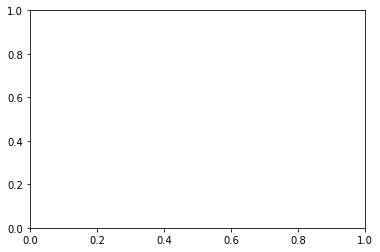

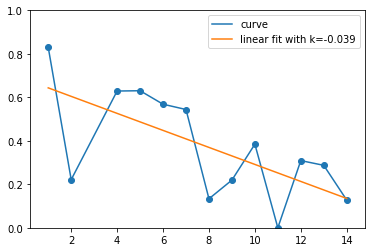

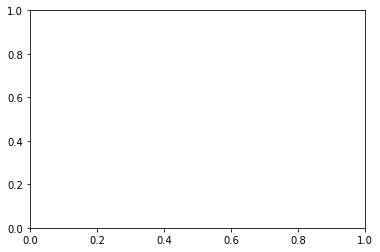

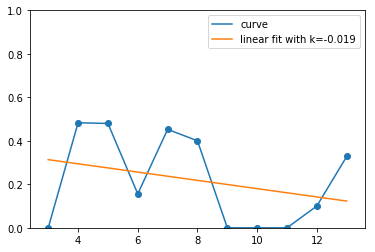

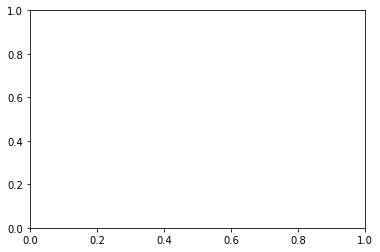

...

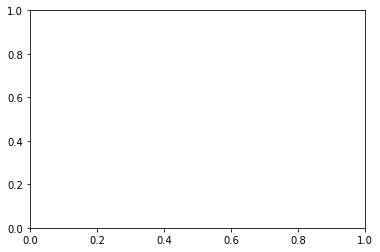

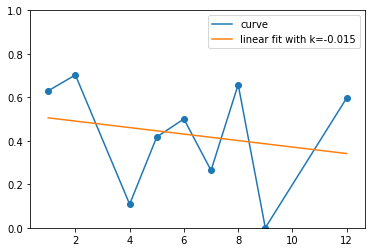

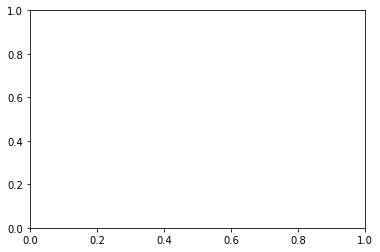

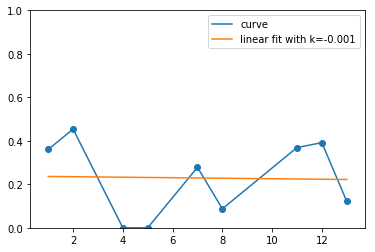

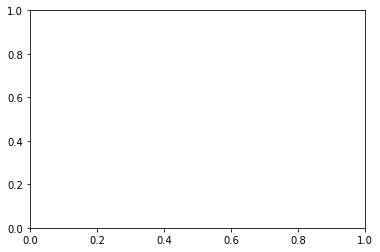

In [6]:
pad_slope = {}
for pad_name in pads.keys():
    pad = pads[pad_name]
    pad.create_paragraphs_from_ops(elem_ops_treated[pad_name])
    pad.BuildWindowOperation(200000)
    pad.getTextByWin(True,model) 
    pad.computeDistance()
    pad.PlotSimilarityDistribution(False)
    pad_slope[pad_name] = pad.fitting_slope

In [8]:
for pad_name in pads.keys():
    pad = pads[pad_name]
    pad_slope[pad_name] = pad.fitting_slope

In [9]:
pad_slope

{'edusearch2014_report-121-15-1MDP': -1000,
 'edusearch2014_report-121-25-3MDP': -0.039,
 'edusearch2014_report-123-15-1MDP': -1000,
 'edusearch2014_report-123-25-3MDP': -0.019,
 'edusearch2014_report-126-15-1MDP': -1000,
 'edusearch2014_report-126-25-3MDP': -0.036,
 'edusearch2014_report-127-15-1MDP': 0.043,
 'edusearch2014_report-127-25-3MDP': -0.057,
 'edusearch2014_report-128-15-1MDP': -0.31,
 'edusearch2014_report-128-25-3MDP': -0.016,
 'edusearch2014_report-129-15-1MDP': -1000,
 'edusearch2014_report-129-25-3MDP': -0.052,
 'edusearch2014_report-130-15-1MDP': -1000,
 'edusearch2014_report-130-25-3MDP': -0.017,
 'edusearch2014_report-131-15-1MDP': -1000,
 'edusearch2014_report-131-25-3MDP': 0.01,
 'edusearch2014_report-132-15-1MDP': -1000,
 'edusearch2014_report-132-25-3MDP': 0.081,
 'edusearch2014_report-133-15-1MDP': -1000,
 'edusearch2014_report-133-25-3MDP': -0.0,
 'edusearch2014_report-134-15-1MDP': 0.421,
 'edusearch2014_report-134-25-3MDP': -0.018,
 'edusearch2014_report-135